<a href="https://colab.research.google.com/github/stahelin/puc_dl2cv/blob/main/tau.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1 - Instalando todas as dependencias do OpenSTL (Mesmo que redundantes, por garantia) e montando o Drive
*Reinicie o ambiente de execução antes de prosseguir para utilizar as versões mais recentes instaladas


In [ ]:
!git clone https://github.com/chengtan9907/OpenSTL

In [ ]:
import os
!pip install fvcore
!pip install -e OpenSTL
os.chdir('/content/OpenSTL')

In [ ]:
!pip install argparse
!pip install dask
!pip install decord
!pip install git+https://github.com/facebookresearch/fvcore.git
!pip install hickle
!pip install lpips
!pip install matplotlib
!pip install netCDF4
!pip install numpy
!pip install opencv-python
!pip install packaging
!pip install pandas
!pip install scikit-image
!pip install scikit-learn
!pip install torch
!pip install timm
!pip install tqdm
!pip install xarray==0.19.0

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


#2 - Carregando bibliotecas

In [ ]:
import pickle
import cv2
import numpy as np
import os
import numpy as np
import torch
from torch.utils.data import Dataset
from openstl.utils import show_video_line
from openstl.api import BaseExperiment
from openstl.utils import create_parser, default_parser

#3 - Pré-processamento dos vídeos (redimensionamento, armazenamento dos frames em pkl)

In [ ]:
batch_size = 1
pre_seq_length = 10
aft_seq_length = 20

def sample_frames(video_path, num_frames=20):
    height = 224
    width = 224
    # Lê o vídeo
    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    # Amostra uniformemente quadros do vídeo
    frame_idxs = np.linspace(0, total_frames-1, num_frames, dtype=int)
    frames = []
    for idx in frame_idxs:
        video.set(cv2.CAP_PROP_POS_FRAMES, idx)
        _, frame = video.read()
        frame = cv2.resize(frame, (height, width))
        frames.append(frame)
    video.release()
    return np.stack(frames)

def process_folder(folder_path, pre_slen=10, aft_slen=10, suffix='.avi'):
    # Obtém todos os vídeos nesta pasta
    videos = []
    files = os.listdir(folder_path)
    for file in files:
        video_path = os.path.join(folder_path, file)
        if os.path.isfile(video_path) and file.endswith(suffix):
            video = sample_frames(video_path, pre_slen + aft_slen)
            videos.append(video)
    # Empilha quadros de vídeo de cada pasta
    data = np.stack(videos).transpose(0, 1, 4, 2, 3)

    # se os dados estão em [0, 255], reescala para [0, 1]
    if data.max() > 1.0:
        data = data.astype(np.float32) / 255.0

    return data[:, :pre_slen], data[:, pre_slen:]

# Caminho base para as pastas de dados no Google Drive
base_path = '/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/video_dataset'

dataset = {}
folders = ['train', 'val', 'test']
for folder in folders:
    folder_path = os.path.join(base_path, folder)  # Caminho atualizado
    data_x, data_y = process_folder(folder_path, pre_slen=pre_seq_length, aft_slen=aft_seq_length, suffix='.avi')
    dataset['X_' + folder], dataset['Y_' + folder] = data_x, data_y

# Salva como um arquivo pkl
with open('/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/dataset_224.pkl', 'wb') as f:
    pickle.dump(dataset, f)

## Carregando dados

with open('/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/dataset_224.pkl', 'rb') as f:
    dataset = pickle.load(f)

train_x, train_y = dataset['X_train'], dataset['Y_train']
print(train_x.shape)



(7, 10, 3, 224, 224)


#4 - TAU - Configurações de treinamento

In [67]:
custom_training_config = {
    'pre_seq_length': pre_seq_length,
    'aft_seq_length': aft_seq_length,
    'total_length': pre_seq_length + aft_seq_length,
    'batch_size': batch_size,
    'val_batch_size': batch_size,
    'epoch': 50,
    'lr': 0.001,
    'metrics': ['mse', 'mae', "rmse"],

    'ex_name': 'tau',
    'dataname': 'custom',
    'in_shape': [10, 3, 224, 224],
}

custom_model_config = {
    'method': 'SimVP',
    'model_type': 'tau',
    'N_S': 4,
    'N_T': 8,
    'hid_S': 64,
    'hid_T': 256
}

#5 - Dataloader

In [68]:
class CustomDataset(Dataset):
    def __init__(self, X, Y, normalize=False):
        super(CustomDataset, self).__init__()
        self.X = X
        self.Y = Y
        self.mean = None
        self.std = None

        if normalize:
            # get the mean/std values along the channel dimension
            mean = data.mean(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            std = data.std(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            data = (data - mean) / std
            self.mean = mean
            self.std = std

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, index):
        data = torch.tensor(self.X[index]).float()
        labels = torch.tensor(self.Y[index]).float()
        return data, labels


X_train, X_val, X_test, Y_train, Y_val, Y_test = dataset['X_train'], dataset[
    'X_val'], dataset['X_test'], dataset['Y_train'], dataset['Y_val'], dataset['Y_test']

train_set = CustomDataset(X=X_train, Y=Y_train)
val_set = CustomDataset(X=X_val, Y=Y_val)
test_set = CustomDataset(X=X_test, Y=Y_test)

dataloader_train = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_val = torch.utils.data.DataLoader(
    val_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_test = torch.utils.data.DataLoader(
    test_set, batch_size=batch_size, shuffle=True, pin_memory=True)

#6 - Configurações experimentais

In [69]:
args = create_parser().parse_args([])
config = args.__dict__

# Atualiza a configuração de treinamento
config.update(custom_training_config)
# Atualiza a configuração do modelo
config.update(custom_model_config)
# Preenche com valores padrão
default_values = default_parser()
for attribute in default_values.keys():
    if config[attribute] is None:
        config[attribute] = default_values[attribute]

exp = BaseExperiment(args, dataloaders=(dataloader_train, dataloader_val, dataloader_test))


Use non-distributed mode with GPU: cuda:0
Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
CUDA available: True
CUDA_HOME: /usr/local/cuda
NVCC: Build cuda_11.8.r11.8/compiler.31833905_0
GPU 0: NVIDIA A100-SXM4-40GB
GCC: gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
PyTorch: 2.1.0+cu118
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75

In [70]:
import contextlib
with open('training_output.txt', 'w') as f:
    with contextlib.redirect_stdout(f):
        exp.train()
        exp.test()


train loss: 0.0366 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.08it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:32] Intermediate result: 5320.95  (Index 300)


train loss: 0.0240 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00, 10.07it/s]

[>>>>>>>                                           ] 1/7, 15.8 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.8 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:34] Intermediate result: 3379.4778  (Index 301)


train loss: 0.0151 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.20it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:37] Intermediate result: 2145.2788  (Index 302)


train loss: 0.0068 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.20it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:38] Intermediate result: 1053.6359  (Index 303)


train loss: 0.0062 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.23it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.9 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:40] Intermediate result: 904.15875  (Index 304)


train loss: 0.0049 | data time: 0.0051: 100%|██████████| 7/7 [00:00<00:00,  9.85it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.8 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:44] Intermediate result: 611.6886  (Index 305)


train loss: 0.0034 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00, 10.14it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.0 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:46] Intermediate result: 492.50073  (Index 306)


train loss: 0.0027 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00, 10.04it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:48] Intermediate result: 415.06436  (Index 307)


train loss: 0.0024 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.15it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:50] Intermediate result: 350.18994  (Index 308)


train loss: 0.0021 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.26it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.0 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:51] Intermediate result: 309.6028  (Index 309)


train loss: 0.0018 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.90it/s]

[>>>>>>>                                           ] 1/7, 16.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:55] Intermediate result: 275.29733  (Index 310)


train loss: 0.0016 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.21it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.1 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:02:56] Intermediate result: 253.00233  (Index 311)


train loss: 0.0024 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00,  9.95it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:00] Intermediate result: 232.78996  (Index 312)


train loss: 0.0013 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00, 10.15it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:01] Intermediate result: 225.85536  (Index 313)


train loss: 0.0012 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.05it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:05] Intermediate result: 214.881  (Index 314)


train loss: 0.0013 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.23it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:07] Intermediate result: 194.2134  (Index 315)


train loss: 0.0011 | data time: 0.0040: 100%|██████████| 7/7 [00:00<00:00, 10.30it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:09] Intermediate result: 197.25272  (Index 316)


train loss: 0.0012 | data time: 0.0041: 100%|██████████| 7/7 [00:00<00:00, 10.29it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:10] Intermediate result: 175.1869  (Index 317)


train loss: 0.0010 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00, 10.19it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:12] Intermediate result: 170.60683  (Index 318)


train loss: 0.0011 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.08it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:15] Intermediate result: 159.1467  (Index 319)


train loss: 0.0009 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.18it/s]

[>>>>>>>                                           ] 1/7, 16.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:17] Intermediate result: 151.42432  (Index 320)


train loss: 0.0040 | data time: 0.0053: 100%|██████████| 7/7 [00:00<00:00, 10.18it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:20] Intermediate result: 140.83119  (Index 321)


train loss: 0.0008 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.21it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:21] Intermediate result: 141.17998  (Index 322)


train loss: 0.0041 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.28it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:23] Intermediate result: 137.98349  (Index 323)


train loss: 0.0008 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.24it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:26] Intermediate result: 134.04475  (Index 324)


train loss: 0.0008 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00, 10.15it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:27] Intermediate result: 129.64638  (Index 325)


train loss: 0.0010 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00, 10.08it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:29] Intermediate result: 132.26994  (Index 326)


train loss: 0.0007 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.15it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:32] Intermediate result: 124.76808  (Index 327)


train loss: 0.0040 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.28it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:33] Intermediate result: 124.53875  (Index 328)


train loss: 0.0007 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00,  9.93it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:36] Intermediate result: 129.44514  (Index 329)


train loss: 0.0041 | data time: 0.0041: 100%|██████████| 7/7 [00:00<00:00, 10.07it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:38] Intermediate result: 119.188126  (Index 330)


train loss: 0.0006 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.02it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:41] Intermediate result: 115.52586  (Index 331)


train loss: 0.0006 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.16it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.9 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:43] Intermediate result: 115.19408  (Index 332)


train loss: 0.0006 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.12it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:46] Intermediate result: 114.25408  (Index 333)


train loss: 0.0006 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.25it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:47] Intermediate result: 116.32153  (Index 334)


train loss: 0.0006 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.24it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:49] Intermediate result: 114.1506  (Index 335)


train loss: 0.0006 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00,  9.95it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:52] Intermediate result: 114.93061  (Index 336)


train loss: 0.0006 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.21it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:53] Intermediate result: 112.743675  (Index 337)


train loss: 0.0006 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00, 10.13it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:56] Intermediate result: 111.42729  (Index 338)


train loss: 0.0006 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00, 10.18it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.1 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:58] Intermediate result: 108.89608  (Index 339)


train loss: 0.0006 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00, 10.15it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.1 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:03:59] Intermediate result: 108.447205  (Index 340)


train loss: 0.0007 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.25it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:02] Intermediate result: 109.57123  (Index 341)


train loss: 0.0006 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.30it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:03] Intermediate result: 108.327385  (Index 342)


train loss: 0.0006 | data time: 0.0044: 100%|██████████| 7/7 [00:00<00:00, 10.23it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:06] Intermediate result: 108.41868  (Index 343)


train loss: 0.0007 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.28it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:08] Intermediate result: 107.8448  (Index 344)


train loss: 0.0006 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00, 10.06it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:10] Intermediate result: 107.92324  (Index 345)


train loss: 0.0008 | data time: 0.0051: 100%|██████████| 7/7 [00:00<00:00, 10.08it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:12] Intermediate result: 107.89806  (Index 346)


train loss: 0.0038 | data time: 0.0038: 100%|██████████| 7/7 [00:00<00:00, 10.31it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:14] Intermediate result: 107.824814  (Index 347)


train loss: 0.0005 | data time: 0.0042: 100%|██████████| 7/7 [00:00<00:00, 10.20it/s]


[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:16] Intermediate result: 107.804306  (Index 348)


train loss: 0.0006 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00, 10.27it/s]

[                                                  ] 0/7, elapsed: 0s, ETA:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 15.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 21:04:18] Intermediate result: 107.78383  (Index 349)
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 19.4 task/s, elapsed: 0s, ETA:     0s

#7 - Resultados

In [71]:
import re

def process_log_file(filename):
    with open(filename, 'r') as file:
        lines = file.readlines()

    train_losses = []
    val_losses = []
    val_mse = []
    val_mae = []

    for line in lines:
        # Encontrar e armazenar a perda de treinamento
        train_match = re.search(r'Train Loss: ([0-9\.]+)', line)
        if train_match:
            train_losses.append(float(train_match.group(1)))

        # Encontrar e armazenar a perda de validação
        val_match = re.search(r'Vali Loss: ([0-9\.]+)', line)
        if val_match:
            val_losses.append(float(val_match.group(1)))

        # Exemplo para capturar MSE e MAE da validação
        mse_match = re.search(r'mse:([0-9\.]+)', line)
        if mse_match:
            val_mse.append(float(mse_match.group(1)))

        mae_match = re.search(r'mae:([0-9\.]+)', line)
        if mae_match:
            val_mae.append(float(mae_match.group(1)))

    return train_losses, val_losses, val_mse, val_mae

train_losses, val_losses, val_mse, val_mae = process_log_file('training_output.txt')


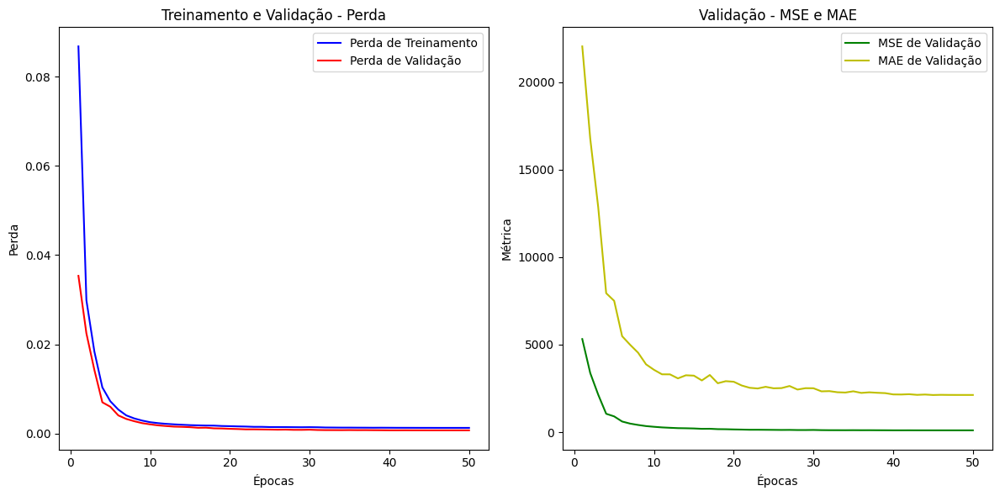

In [72]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)


# Ajustar o tamanho das listas para corresponder
min_length = min(len(epochs), len(val_mse), len(val_mae))
epochs = epochs[:min_length]
val_mse = val_mse[:min_length]
val_mae = val_mae[:min_length]

# Agora, plotar os gráficos
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-', label='Perda de Treinamento')
plt.plot(epochs, val_losses, 'r-', label='Perda de Validação')
plt.title('Treinamento e Validação - Perda')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, val_mse, 'g-', label='MSE de Validação')
plt.plot(epochs, val_mae, 'y-', label='MAE de Validação')
plt.title('Validação - MSE e MAE')
plt.xlabel('Épocas')
plt.ylabel('Métrica')
plt.legend()

plt.tight_layout()
plt.show()


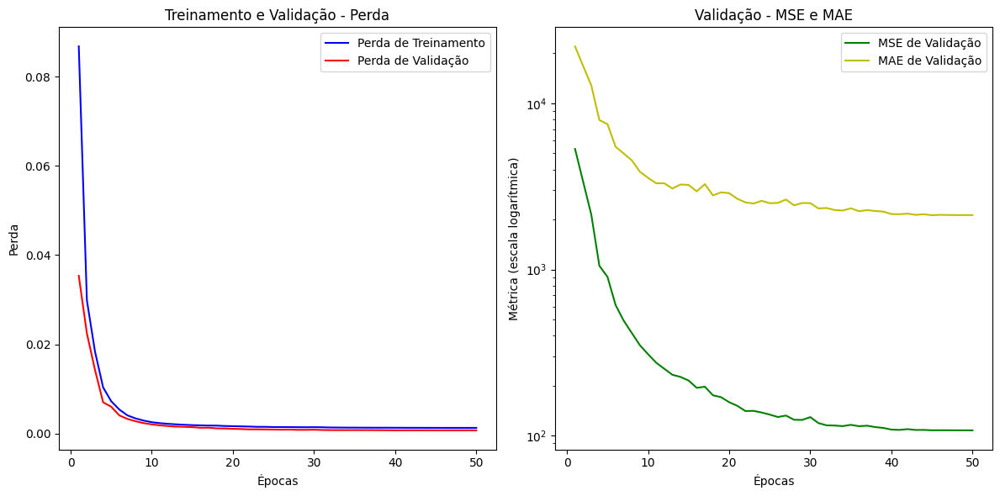

In [73]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)

# Ajustar o tamanho das listas para corresponder
min_length = min(len(epochs), len(val_mse), len(val_mae))
epochs = epochs[:min_length]
val_mse = val_mse[:min_length]
val_mae = val_mae[:min_length]

# Agora, plotar os gráficos
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-', label='Perda de Treinamento')
plt.plot(epochs, val_losses, 'r-', label='Perda de Validação')
plt.title('Treinamento e Validação - Perda')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, val_mse, 'g-', label='MSE de Validação')
plt.plot(epochs, val_mae, 'y-', label='MAE de Validação')
plt.title('Validação - MSE e MAE')
plt.xlabel('Épocas')
plt.ylabel('Métrica (escala logarítmica)')
plt.yscale('log')
plt.legend()

plt.tight_layout()
plt.show()


tau


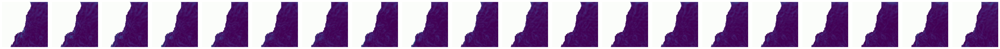

In [74]:
custom_exp = custom_training_config["ex_name"]
print(custom_exp)
inputs = np.load(f'./work_dirs/{custom_exp}/saved/inputs.npy')
preds = np.load(f'./work_dirs/{custom_exp}/saved/preds.npy')
trues = np.load(f'./work_dirs/{custom_exp}/saved/trues.npy')

example_idx = 0
show_video_line(trues[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

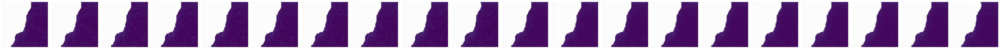

In [75]:
example_idx = 0
show_video_line(preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

/content/OpenSTL/openstl/utils/visualization.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 6))


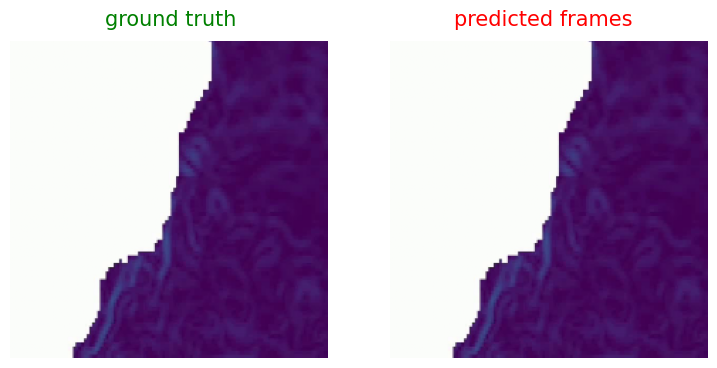

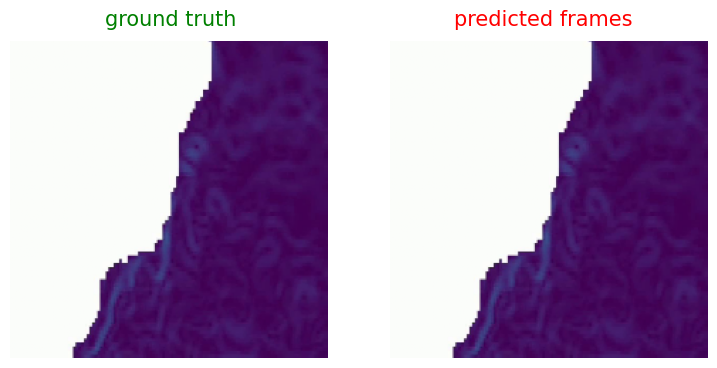

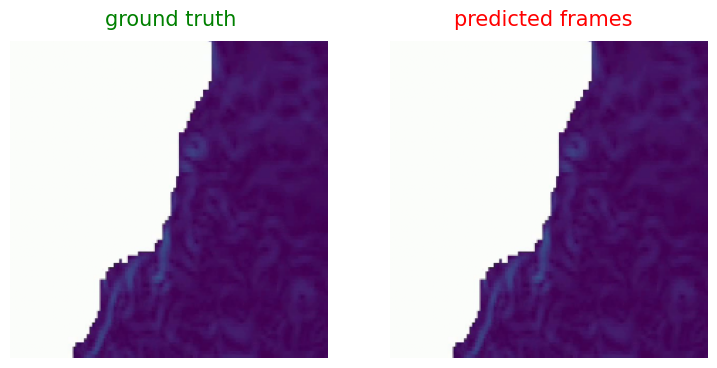

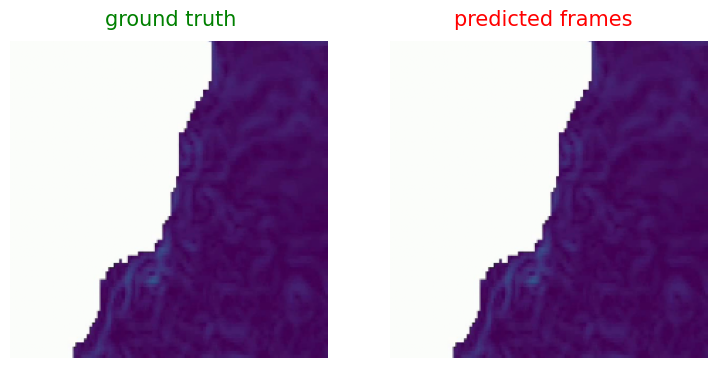

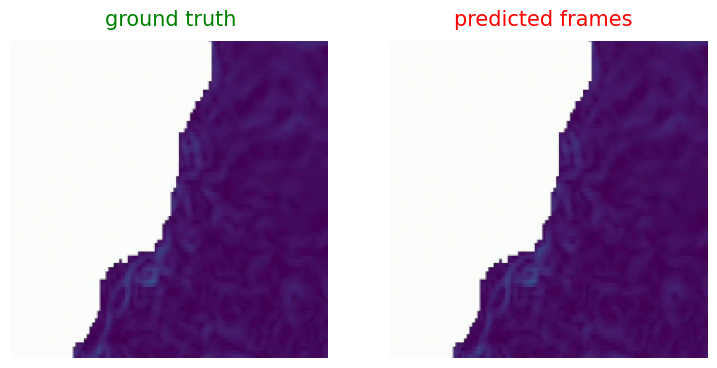

...

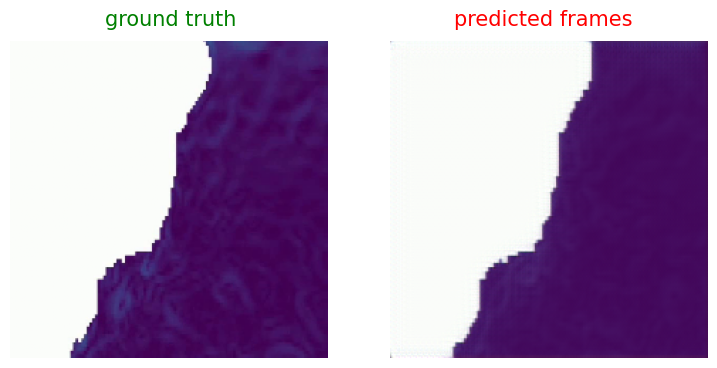

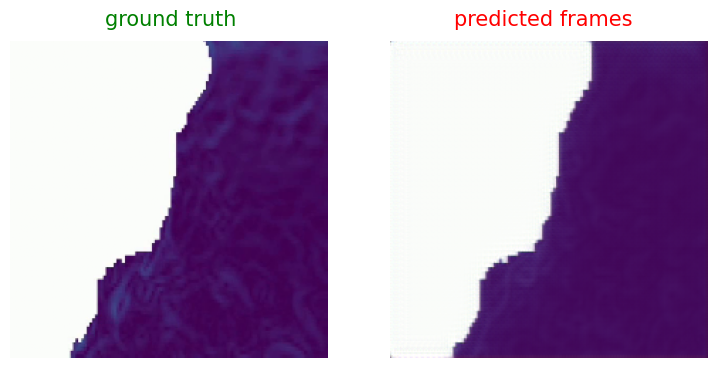

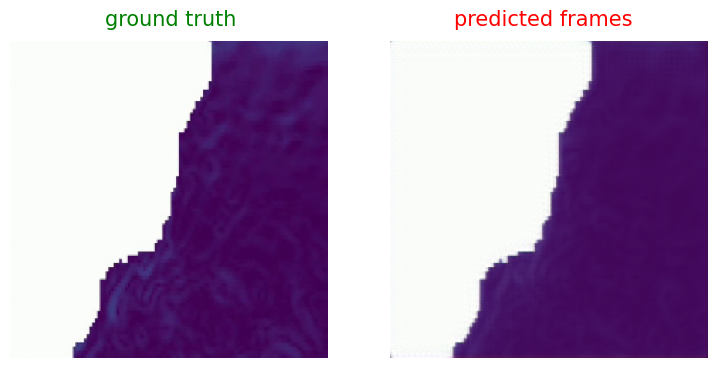

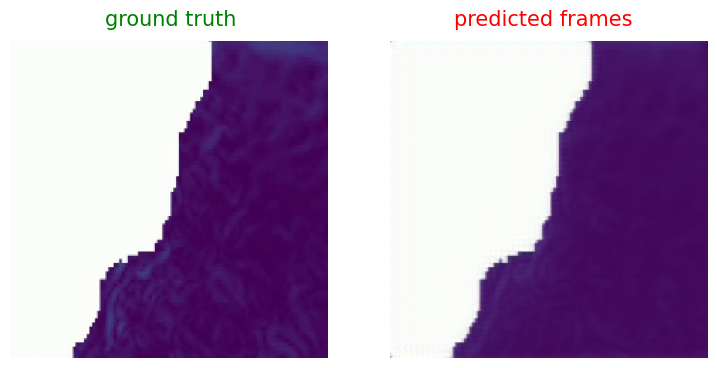

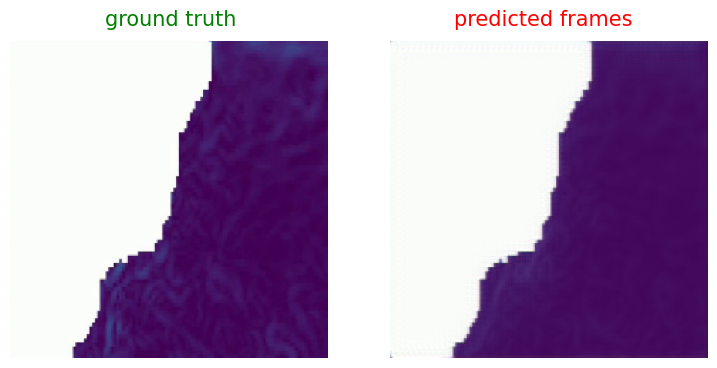

In [76]:
from openstl.utils import show_video_gif_multiple


# Diretório no Google Drive onde você quer salvar o arquivo
save_dir = '/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/'

example_idx = 0
# Caminho completo incluindo o diretório no Google Drive
out_path = save_dir + f'{custom_exp}.gif'

show_video_gif_multiple(inputs[example_idx], trues[example_idx], preds[example_idx], use_rgb=True, out_path=out_path)

example_idx = 0
show_video_gif_multiple(inputs[example_idx], trues[example_idx], preds[example_idx], use_rgb=True, out_path=f'{custom_exp}.gif')